In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import missingno as msno

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
filepath = '../data/phase1_full_df.csv'
full_df = pd.read_csv(filepath)

<ipython-input-3-261a44def4ff>:2: DtypeWarning: Columns (4,7) have mixed types. Specify dtype option on import or set low_memory=False.
  full_df = pd.read_csv(filepath)


In [ ]:
# Dataset overview
print("Shape of the dataset: ",full_df.shape)

Shape of the dataset:  (105392, 1468)


In [ ]:
# preview top rows
full_df.head()

,Loanref,Credit_Score,Mortgage_Insurance,Number_of_units,CLoan_to_value,Debt_to_income,Original_amount,OLoan_to_value,OEIR,Loan_term,...,Seller_41,Seller_42,Seller_43,Seller_44,Seller_45,Seller_46,Seller_47,Seller_48,Seller_49,DFlag
0,F16Q30395024,760.0,30.0,1,95,39.0,237000.0,95.0,3.375,360,...,0,0,0,0,0,0,0,0,0,0
1,F16Q30138152,797.0,0.0,1,80,30.0,417000.0,80.0,2.625,180,...,0,0,0,0,0,0,0,0,0,0
2,F16Q40029727,766.0,0.0,1,80,50.0,280000.0,80.0,3.875,360,...,0,0,0,0,0,0,0,0,0,0
3,F16Q40121323,796.0,0.0,1,75,39.0,111000.0,75.0,3.250,180,...,0,0,0,0,0,0,0,0,0,0
4,F16Q40216810,785.0,0.0,1,80,44.0,220000.0,80.0,3.625,360,...,0,0,0,0,1,0,0,0,0,0


In [ ]:
# Select string columns & exclude features to convert to numeric
cols_to_numeric = full_df.select_dtypes(include=['object']).columns.to_list()
cols_to_numeric.remove('Loanref')

In [ ]:
for col in cols_to_numeric:
  full_df[col] = pd.to_numeric(full_df[col], errors='coerce')

In [ ]:
full_df.isna().sum()[full_df.isna().sum() > 0]

,0
CLoan_to_value,833
Debt_to_income,6081
OLoan_to_value,549


In [ ]:
# Drop na -- to have clean data
full_df = full_df.dropna()

In [ ]:
# -- confirm we have all columns as numeric except Loanref[object]
len(full_df.select_dtypes(include=[np.number]).columns.to_list())

1467

In [ ]:
numeric_features = full_df.select_dtypes(include=[np.number]).columns.to_list()
categorical_features = [col for col in full_df.columns if full_df[col].nunique() < 10 and full_df[col].dtype == 'int64']

In [ ]:
len(categorical_features)

1458

In [ ]:
# confirm remaining float64 has no categorical
full_df.select_dtypes(include=['float64']).columns

Index(['Credit_Score', 'Mortgage_Insurance', 'CLoan_to_value',
       'Debt_to_income', 'Original_amount', 'OLoan_to_value', 'OEIR',
       'Single_borrower'],
      dtype='object')

In [ ]:
# -- convert Single_borrower to categorical int
full_df['Single_borrower'] = full_df['Single_borrower'].astype('int64')
full_df['Single_borrower'].dtype

dtype('int64')

In [ ]:
# append 'Single borrower to categorical , remove from numerical
categorical_features.append('Single_borrower')

In [ ]:
full_df.select_dtypes(include=['float64']).head()

,Credit_Score,Mortgage_Insurance,CLoan_to_value,Debt_to_income,Original_amount,OLoan_to_value,OEIR
0,760.0,30.0,95.0,39.0,237000.0,95.0,3.375
1,797.0,0.0,80.0,30.0,417000.0,80.0,2.625
2,766.0,0.0,80.0,50.0,280000.0,80.0,3.875
3,796.0,0.0,75.0,39.0,111000.0,75.0,3.250
4,785.0,0.0,80.0,44.0,220000.0,80.0,3.625


In [ ]:
binary_cols = [col for col in numeric_features if full_df[col].nunique() == 2]

In [ ]:
continous_cols = list(set(numeric_features) - set(categorical_features))

In [ ]:
# update categorical/Indicator variables -- remove Target
categorical_features.remove('DFlag')


 Distribution of Target(DFlag):
DFlag
0    0.993533
1    0.006467
Name: proportion, dtype: float64


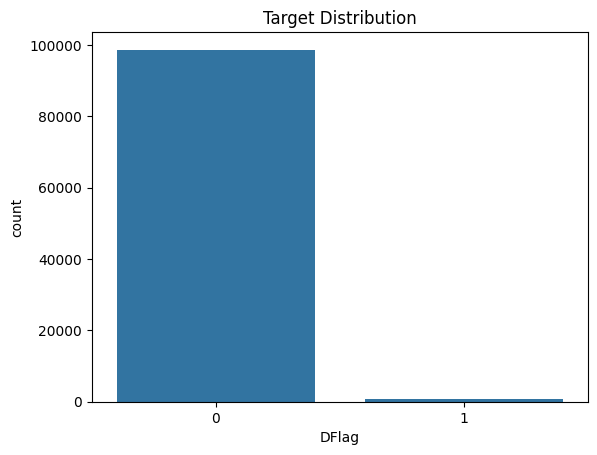

In [ ]:
# Target variable ('DFlag') Analysis
print("\n Distribution of Target(DFlag):")
print(full_df['DFlag'].value_counts(normalize=True))
sns.countplot(data=full_df, x='DFlag')
plt.title('Target Distribution')
plt.show()

-------------------
###### UNIVARIATE ANALYSIS
---------------

In [ ]:
px.pie(full_df, names='DFlag', title='Distribution of Default')

In [ ]:
# NUMERIC FEATURES DISTRIBUTION & OUTLIER
continous_cols

for col in continous_cols:
  fig_hist = px.histogram(full_df, x=col, title=f'Distribution of {col}',
                          nbins=50)
  fig_hist.show()

  fig_box = px.box(full_df, y=col, title=f'Outlier detection for {col}')
  fig_box.show()

In [ ]:
# CATEGORICAL/INDICATOR FEATURES FREQUENCY
excluded_cols = ('is_property_state_', 'MSA_', 'PostalCode_', 'Seller_') # -- cols not good for generalization
cat_cols = [col for col in categorical_features if not col.startswith(excluded_cols)]

In [ ]:
for col in cat_cols:
  freq_df = full_df[col].value_counts().reset_index()
  freq_df.columns = [col, 'count']
  fig_cat = px.bar(freq_df, x=col, y='count', title=f'Distribution of {col}')
  fig_cat.show()

In [ ]:
# BIVARIATE ANALYSIS
for col in continous_cols:
  fig_bi = px.box(full_df, x='DFlag', y=col,
                  title=f'{col} by Default Status')
  fig_bi.show()

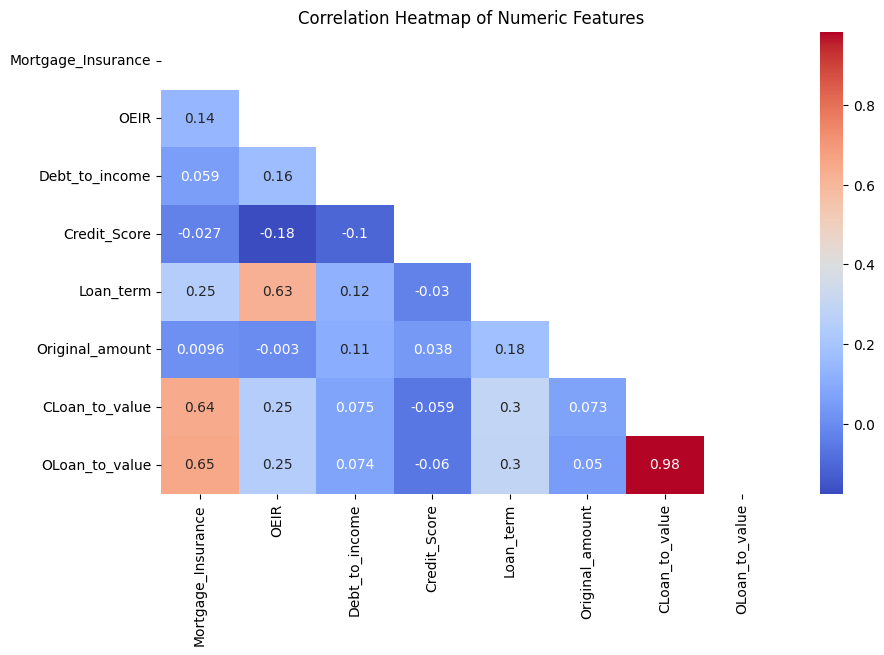

In [ ]:
correl = full_df[continous_cols].corr()
plt.figure(figsize=(10, 6))
mask = np.triu(np.ones_like(correl, dtype=bool))
sns.heatmap(correl, annot=True, mask=mask, cmap='coolwarm')
plt.title('Correlation Heatmap of Numeric Features')
plt.show()

In [ ]:
# Scatter Matrix for numeric relations
plt.figure(figsize=(10, 13))
fig = px.scatter_matrix(full_df, dimensions=continous_cols, color='DFlag')
fig.update_layout(title='Scatter Matrix')
fig.update_layout(
    height=800,
    width=1000,
    font=dict(size=10)
)
fig.update_layout(
    xaxis=dict(tickangle=45),
    yaxis=dict(tickangle=0)
)
fig.show()

<Figure size 1000x1300 with 0 Axes>

In [ ]:
# Save the dataset
filepath = '../data/'
full_df.to_csv(filepath+'phase2_CreditScoring.csv', index=False)